## RNN SCENARIO 2 POD Microservice

In [1]:
#pip install plotly==5.1.0
#at command line execute: 
# conda activate otumba
# conda install scikit-learn scipy matplotlib
# conda install nbformat
# conda install tqdm

In [2]:
import plotly.graph_objects as go 
import numpy as np 
import pandas as pd 

In [3]:
training_filename = 'dataset_1000000_50_1.cvs'
valid_filename = 'dataset_100000_110_1.cvs'
# Data from production
prod_filename  = 'dataset_100000_150_1.cvs'

In [4]:
train = pd.read_csv(training_filename)
valid = pd.read_csv(valid_filename)
prod = pd.read_csv(prod_filename)
train.head()

,pods,file_descriptors,receive_packets,transmit_packets,dropped_packets,cpu_usage_seconds,cpu_throttled_seconds,memory_working_bytes,memory_usage_bytes,load,date
0,1.0,0.0,0.0,0.0,0.0,0.000350,0.0,0.0,2.0,50,2021-08-17 16:39:26.690067
1,1.0,0.0,0.0,0.0,0.0,0.000350,0.0,0.0,2.0,50,2021-08-17 16:39:26.732453
2,1.0,0.0,0.0,0.0,0.0,0.000350,0.0,0.0,2.0,50,2021-08-17 16:39:26.776369
3,1.0,0.0,0.0,0.0,0.0,0.000351,0.0,0.0,2.0,50,2021-08-17 16:39:26.820005
4,1.0,0.0,0.0,0.0,0.0,0.000351,0.0,0.0,2.0,50,2021-08-17 16:39:26.862225


# Standardize Data

In [5]:
from sklearn.preprocessing import StandardScaler
def parse_and_standardize(df: pd.DataFrame, scaler: StandardScaler = None):
    df['timestamp'] = pd.to_datetime(df['date'])
    df['stand_value'] = df['cpu_usage_seconds']
    if not scaler:
        scaler = StandardScaler()
        scaler.fit(df['stand_value'].values.reshape(-1, 1))
    df['stand_value'] = scaler.transform(df['stand_value'].values.reshape(-1, 1))
    return scaler

data_scaler = parse_and_standardize(train)
parse_and_standardize(valid, data_scaler)

parse_and_standardize(prod, data_scaler)

StandardScaler()

In [6]:
layout = dict(xaxis=dict(title='Timestamp'), yaxis=dict(title='CPU Utilization')) 
fig = go.Figure(layout=layout) 
fig.add_trace(go.Scatter(x=train['timestamp'], y=train['cpu_usage_seconds'], 
                         mode='markers', name='Train Non-anomaly',
                         marker=dict(color='blue')))

In [7]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=valid['timestamp'], y=valid['cpu_usage_seconds'], 
                         mode='markers', name='Valid Non-anomaly',
                         marker=dict(color='blue')))

## LSTM Long Short-Term Memory

In [8]:
import torch 
import torch.nn as nn
import torch.optim as opt
from tqdm import tqdm
from torch.utils.data import Dataset, DataLoader 

In [9]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [10]:
class CPUDataset(Dataset):
    def __init__(self, data: pd.DataFrame, size: int):
        self.chunks = torch.FloatTensor(data['stand_value']).unfold(0, size, size)
        
    def __len__(self):
        return self.chunks.size(0)
    
    def __getitem__(self, i):
        x = self.chunks[i]
        return x

train_ds = CPUDataset(train, 64)
valid_ds = CPUDataset(valid, 64)
prod_ds  = CPUDataset(prod, 64)

In [11]:
class LSTMModel(nn.Module):
    def __init__(self, in_size, hidden_size, out_size, device):
        super().__init__()
        self.hidden_size = hidden_size
        self.lstm = nn.LSTM(in_size, hidden_size)
        self.linear = nn.Linear(hidden_size, out_size)
        self.device = device
        self.init_hidden()
        
    def forward(self, x):
        out, self.hidden_state = self.lstm(
            x.view(len(x), 1, -1), self.hidden_state
        )
        self.hidden_state = tuple(
            [h.detach() for h in self.hidden_state]
        )
        out = out.view(len(x), -1)
        out = self.linear(out)
        return out
    
    def init_hidden(self):
        self.hidden_state = (
            torch.zeros((1, 1, self.hidden_size)).to(self.device),
            torch.zeros((1, 1, self.hidden_size)).to(self.device))

In [12]:
def train_model(model: LSTMModel, dataloaders: dict, optimizer: opt.Optimizer, 
                scheduler, criterion, device: torch.device, epochs: int):
    losses_data = {'train': [], 'valid': []}
    model.to(device)
    for epoch in tqdm(range(epochs)):
        print(f'Epoch {epoch}/{epochs-1}')
        for phase in ['train', 'valid']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.
            running_total = 0.
            
        # Here changes start
            for idx, sequence in enumerate(dataloaders[phase]):
                value = sequence
                value = value.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    out = model(value.view(-1, 1))
                    loss = criterion(out.view(-1), value.view(-1))
        # Here changes end

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        scheduler.step()

                running_loss += loss.item() * out.size(0)
                running_total += out.size(0)

            epoch_loss = running_loss / running_total
            print(f'{phase.capitalize()} Loss: {epoch_loss}')
            losses_data[phase].append(epoch_loss)
    return losses_data

In [13]:
epochs = 70
model = LSTMModel(1, 128, 1, device)
dataloaders = {
    'train': DataLoader(train_ds, batch_size=1),
    'valid': DataLoader(valid_ds, batch_size=1)
}
optim = opt.Adam(params=model.parameters(), lr=1e-3)
sched = opt.lr_scheduler.OneCycleLR(
  optimizer=optim, max_lr=1e-3, steps_per_epoch=len(dataloaders['train']), epochs=epochs
)
criterion = nn.MSELoss()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [14]:
losses = train_model(model, dataloaders, optim, sched, criterion, device, epochs)

  0%|          | 0/70 [00:00<?, ?it/s]

Epoch 0/69


  1%|▏         | 1/70 [00:02<02:18,  2.01s/it]

Train Loss: 0.9971664868410319
Valid Loss: 7.498659619166014
Epoch 1/69


  3%|▎         | 2/70 [00:04<02:18,  2.04s/it]

Train Loss: 0.8272867819951156
Valid Loss: 4.778103268207745
Epoch 2/69


  4%|▍         | 3/70 [00:06<02:15,  2.02s/it]

Train Loss: 0.48059513855661185
Valid Loss: 2.950798161007277
Epoch 3/69


  6%|▌         | 4/70 [00:08<02:12,  2.01s/it]

Train Loss: 0.2892178881297209
Valid Loss: 1.3029294554877338
Epoch 4/69


  7%|▋         | 5/70 [00:10<02:09,  1.99s/it]

Train Loss: 0.1241253703060952
Valid Loss: 0.6894190325030929
Epoch 5/69


  9%|▊         | 6/70 [00:12<02:08,  2.01s/it]

Train Loss: 0.05217893470406106
Valid Loss: 0.162613858810101
Epoch 6/69


 10%|█         | 7/70 [00:14<02:05,  1.99s/it]

Train Loss: 0.029060159975987897
Valid Loss: 1.0122889289401218
Epoch 7/69


 11%|█▏        | 8/70 [00:16<02:03,  1.99s/it]

Train Loss: 0.20778880350327822
Valid Loss: 2.3731373621302065
Epoch 8/69


 13%|█▎        | 9/70 [00:17<01:59,  1.95s/it]

Train Loss: 0.16795840279635266
Valid Loss: 0.7344952758004002
Epoch 9/69


 14%|█▍        | 10/70 [00:19<01:56,  1.94s/it]

Train Loss: 0.07728286055102535
Valid Loss: 1.4847452612169467
Epoch 10/69


 16%|█▌        | 11/70 [00:21<01:54,  1.95s/it]

Train Loss: 0.10863415571890846
Valid Loss: 1.9776140073432684
Epoch 11/69


 17%|█▋        | 12/70 [00:23<01:54,  1.98s/it]

Train Loss: 0.10156695804211835
Valid Loss: 0.4156945530101596
Epoch 12/69


 19%|█▊        | 13/70 [00:25<01:53,  1.99s/it]

Train Loss: 0.023252625014004477
Valid Loss: 1.372561655359907
Epoch 13/69


 20%|██        | 14/70 [00:27<01:52,  2.02s/it]

Train Loss: 0.11253840496938604
Valid Loss: 1.706858766323701
Epoch 14/69


 21%|██▏       | 15/70 [00:30<01:53,  2.07s/it]

Train Loss: 0.07983310039682834
Valid Loss: 1.7292016945339128
Epoch 15/69


 23%|██▎       | 16/70 [00:32<01:50,  2.05s/it]

Train Loss: 0.07189002495210475
Valid Loss: 1.0486121551197567
Epoch 16/69


 24%|██▍       | 17/70 [00:34<01:48,  2.04s/it]

Train Loss: 0.051427432334755524
Valid Loss: 1.2172053581836315
Epoch 17/69


 26%|██▌       | 18/70 [00:36<01:45,  2.02s/it]

Train Loss: 0.060972411023803776
Valid Loss: 1.4763629841184132
Epoch 18/69


 27%|██▋       | 19/70 [00:38<01:43,  2.03s/it]

Train Loss: 0.06466401080706492
Valid Loss: 1.2986784087885401
Epoch 19/69


 29%|██▊       | 20/70 [00:40<01:40,  2.02s/it]

Train Loss: 0.0528544559370266
Valid Loss: 1.1035494448873437
Epoch 20/69


 30%|███       | 21/70 [00:42<01:38,  2.02s/it]

Train Loss: 0.05001400125554259
Valid Loss: 0.6835029280056145
Epoch 21/69


 31%|███▏      | 22/70 [00:44<01:36,  2.02s/it]

Train Loss: 0.02813773995923723
Valid Loss: 1.3047392454320568
Epoch 22/69


 33%|███▎      | 23/70 [00:46<01:36,  2.05s/it]

Train Loss: 0.05818993735049762
Valid Loss: 1.0616665671457912
Epoch 23/69


 34%|███▍      | 24/70 [00:48<01:34,  2.05s/it]

Train Loss: 0.038055528326694996
Valid Loss: 0.36380252869000856
Epoch 24/69


 36%|███▌      | 25/70 [00:50<01:32,  2.05s/it]

Train Loss: 0.015510869830288808
Valid Loss: 0.2852831384719558
Epoch 25/69


 37%|███▋      | 26/70 [00:52<01:29,  2.03s/it]

Train Loss: 0.013351831111985962
Valid Loss: 1.2868398881294862
Epoch 26/69


 39%|███▊      | 27/70 [00:54<01:28,  2.05s/it]

Train Loss: 0.05171626224814797
Valid Loss: 1.0620016832683545
Epoch 27/69


 40%|████      | 28/70 [00:56<01:24,  2.02s/it]

Train Loss: 0.03370892123583931
Valid Loss: 1.059294295297696
Epoch 28/69


 41%|████▏     | 29/70 [00:58<01:22,  2.01s/it]

Train Loss: 0.04600143266194366
Valid Loss: 0.7061274609779269
Epoch 29/69


 43%|████▎     | 30/70 [01:00<01:21,  2.04s/it]

Train Loss: 0.031107368354307843
Valid Loss: 1.052499814766651
Epoch 30/69


 44%|████▍     | 31/70 [01:02<01:19,  2.04s/it]

Train Loss: 0.056687475490500794
Valid Loss: 0.37959479840675997
Epoch 31/69


 46%|████▌     | 32/70 [01:04<01:16,  2.02s/it]

Train Loss: 0.01873487628405754
Valid Loss: 0.5460843462007967
Epoch 32/69


 47%|████▋     | 33/70 [01:06<01:14,  2.02s/it]

Train Loss: 0.023903938239019963
Valid Loss: 0.6446497405887405
Epoch 33/69


 49%|████▊     | 34/70 [01:08<01:12,  2.01s/it]

Train Loss: 0.022243846055014733
Valid Loss: 0.3743504590054971
Epoch 34/69


 50%|█████     | 35/70 [01:10<01:10,  2.02s/it]

Train Loss: 0.0227788499736111
Valid Loss: 0.8525451729833519
Epoch 35/69


 51%|█████▏    | 36/70 [01:12<01:08,  2.02s/it]

Train Loss: 0.034883941047825634
Valid Loss: 0.3210963323419159
Epoch 36/69


 53%|█████▎    | 37/70 [01:14<01:06,  2.01s/it]

Train Loss: 0.013189336406659816
Valid Loss: 0.8064739677642172
Epoch 37/69


 54%|█████▍    | 38/70 [01:16<01:04,  2.01s/it]

Train Loss: 0.03812949550828609
Valid Loss: 0.5346153986389743
Epoch 38/69


 56%|█████▌    | 39/70 [01:18<01:02,  2.00s/it]

Train Loss: 0.025181346067714452
Valid Loss: 0.1976762889625613
Epoch 39/69


 57%|█████▋    | 40/70 [01:20<00:59,  1.99s/it]

Train Loss: 0.004527397646289132
Valid Loss: 0.15144807496226173
Epoch 40/69


 59%|█████▊    | 41/70 [01:22<00:57,  1.97s/it]

Train Loss: 0.00463773127718934
Valid Loss: 0.06635231490150335
Epoch 41/69


 60%|██████    | 42/70 [01:24<00:56,  2.01s/it]

Train Loss: 0.0016554055796571443
Valid Loss: 0.03716327699867223
Epoch 42/69


 61%|██████▏   | 43/70 [01:26<00:54,  2.02s/it]

Train Loss: 0.0009440859467286489
Valid Loss: 0.03189323374162383
Epoch 43/69


 63%|██████▎   | 44/70 [01:28<00:52,  2.03s/it]

Train Loss: 0.0035786722754499786
Valid Loss: 0.11293699322791675
Epoch 44/69


 64%|██████▍   | 45/70 [01:30<00:51,  2.05s/it]

Train Loss: 0.005323174449147886
Valid Loss: 0.05627423713049605
Epoch 45/69


 66%|██████▌   | 46/70 [01:32<00:50,  2.08s/it]

Train Loss: 0.0015929327353864896
Valid Loss: 0.27874110695971194
Epoch 46/69


 67%|██████▋   | 47/70 [01:34<00:47,  2.07s/it]

Train Loss: 0.006993238374709636
Valid Loss: 0.25435344521378495
Epoch 47/69


 69%|██████▊   | 48/70 [01:36<00:45,  2.06s/it]

Train Loss: 0.020064108346899673
Valid Loss: 0.05168396955247527
Epoch 48/69


 70%|███████   | 49/70 [01:39<00:43,  2.05s/it]

Train Loss: 0.0016421192729954251
Valid Loss: 0.13738697718708165
Epoch 49/69


 71%|███████▏  | 50/70 [01:41<00:40,  2.04s/it]

Train Loss: 0.005153542943204881
Valid Loss: 0.18490239788633972
Epoch 50/69


 73%|███████▎  | 51/70 [01:43<00:39,  2.06s/it]

Train Loss: 0.012264093373557864
Valid Loss: 0.011610663854060186
Epoch 51/69


 74%|███████▍  | 52/70 [01:45<00:36,  2.04s/it]

Train Loss: 0.00083482384147536
Valid Loss: 0.023160105993368152
Epoch 52/69


 76%|███████▌  | 53/70 [01:47<00:34,  2.03s/it]

Train Loss: 0.002175289517298868
Valid Loss: 0.02001857800092429
Epoch 53/69


 77%|███████▋  | 54/70 [01:49<00:32,  2.03s/it]

Train Loss: 0.00048050806357994067
Valid Loss: 0.1303657299017599
Epoch 54/69


 79%|███████▊  | 55/70 [01:51<00:29,  2.00s/it]

Train Loss: 0.005959775242326561
Valid Loss: 0.17944758983311168
Epoch 55/69


 80%|████████  | 56/70 [01:53<00:27,  1.98s/it]

Train Loss: 0.011831216823714283
Valid Loss: 0.07265248941724692
Epoch 56/69


 81%|████████▏ | 57/70 [01:55<00:25,  1.99s/it]

Train Loss: 0.0050714200372377425
Valid Loss: 0.046216432485030406
Epoch 57/69


 83%|████████▎ | 58/70 [01:57<00:24,  2.00s/it]

Train Loss: 0.0033659664284638384
Valid Loss: 0.026403163911037534
Epoch 58/69


 84%|████████▍ | 59/70 [01:59<00:21,  1.99s/it]

Train Loss: 0.001739364089783627
Valid Loss: 0.023267068117690953
Epoch 59/69


 86%|████████▌ | 60/70 [02:01<00:19,  1.99s/it]

Train Loss: 0.0015047027086303266
Valid Loss: 0.0491321077667108
Epoch 60/69


 87%|████████▋ | 61/70 [02:03<00:18,  2.01s/it]

Train Loss: 0.003274270016234889
Valid Loss: 0.01857723880507824
Epoch 61/69


 89%|████████▊ | 62/70 [02:05<00:15,  1.99s/it]

Train Loss: 0.0014385033242700954
Valid Loss: 0.01005883464466776
Epoch 62/69


 90%|█████████ | 63/70 [02:07<00:14,  2.00s/it]

Train Loss: 0.0006386917093467637
Valid Loss: 0.004973862375895357
Epoch 63/69


 91%|█████████▏| 64/70 [02:09<00:12,  2.04s/it]

Train Loss: 0.0004003035144660885
Valid Loss: 0.00424425219704909
Epoch 64/69


 93%|█████████▎| 65/70 [02:11<00:10,  2.03s/it]

Train Loss: 0.0002581180726583435
Valid Loss: 0.002196387344108157
Epoch 65/69


 94%|█████████▍| 66/70 [02:13<00:08,  2.01s/it]

Train Loss: 0.00017991888925092379
Valid Loss: 0.001861710118641045
Epoch 66/69


 96%|█████████▌| 67/70 [02:15<00:05,  1.99s/it]

Train Loss: 0.00010956188167623246
Valid Loss: 0.0011350374153167309
Epoch 67/69


 97%|█████████▋| 68/70 [02:17<00:03,  1.98s/it]

Train Loss: 7.825149477117152e-05
Valid Loss: 0.0011264812866206202
Epoch 68/69


 99%|█████████▊| 69/70 [02:19<00:01,  1.98s/it]

Train Loss: 6.864499801595742e-05
Valid Loss: 0.00110016182863251
Epoch 69/69


100%|██████████| 70/70 [02:21<00:00,  2.02s/it]

Train Loss: 6.665805697590206e-05
Valid Loss: 0.00109529179687468


In [15]:
train_values = train['stand_value'].values.astype(np.float32).flatten()
valid_values = valid['stand_value'].values.astype(np.float32).flatten()

prod_values  = prod['stand_value'].values.astype(np.float32).flatten()

# Evaluation mode

In [16]:
model.eval()

LSTMModel(
  (lstm): LSTM(1, 128)
  (linear): Linear(in_features=128, out_features=1, bias=True)
)

In [17]:
if torch.cuda.is_available():
   model.cuda()

In [18]:
with torch.no_grad():
    res_train = model(torch.tensor(train_values).to(device))
res_train = res_train.cpu()

In [19]:
with torch.no_grad():
    res_valid = model(torch.tensor(valid_values).to(device))
res_valid = res_valid.cpu()

In [20]:
with torch.no_grad():
    res_prod = model(torch.tensor(prod_values).to(device))
res_prod = res_prod.cpu()

## Errors Calculation

In [21]:
def calculate_prediction_errors(target, predicted, criterion):
    reconstruction_errors = []
    for t, p in zip(target, predicted):
        reconstruction_errors = np.append(
            reconstruction_errors, 
            criterion(p, t).cpu().numpy().flatten()
        )
    return reconstruction_errors

train_pred_errors = calculate_prediction_errors(
    res_train.view(-1), torch.tensor(train_values).view(-1), criterion
)
valid_pred_errors = calculate_prediction_errors(
    res_valid.view(-1), torch.tensor(valid_values).view(-1), criterion
)



prod_pred_errors = calculate_prediction_errors(
    res_prod.view(-1), torch.tensor(prod_values).view(-1), criterion
)

## Dynamic Threshold

In [22]:
window = 20
std_coef= 6

train_pred_errors_windowed = pd.Series(train_pred_errors).rolling(window=window, min_periods=1)
train_dynamic_threshold = train_pred_errors_windowed.mean() + std_coef * train_pred_errors_windowed.std()

valid_pred_errors_windowed = pd.Series(valid_pred_errors).rolling(window=window, min_periods=1)
valid_dynamic_threshold = valid_pred_errors_windowed.mean() + std_coef * valid_pred_errors_windowed.std()


prod_pred_errors_windowed = pd.Series(prod_pred_errors).rolling(window=window, min_periods=1)
prod_dynamic_threshold = prod_pred_errors_windowed.mean() + std_coef * prod_pred_errors_windowed.std()

## Metric Calculation

In [23]:
from sklearn.metrics import precision_recall_fscore_support

def calculate_metrics(
    ground_truth: pd.DataFrame, anomalies_idxs: list
    ):
    predictions = pd.DataFrame(
        index=range(len(ground_truth)), 
        columns=['anomaly_predicted']
    )
    predictions['anomaly_predicted'] = 0
    predictions.iloc[anomalies_idxs] = 1
    
    # Calculation of the confusion matrix can be done using pandas
    confusion_matrix = pd.crosstab(
        ground_truth.loc[:, 'anomaly_label'],
        predictions['anomaly_predicted'], 
        margins=True
    )
    precision, recall, f1, _ = precision_recall_fscore_support(
        ground_truth.loc[:, 'anomaly_label'],
        predictions['anomaly_predicted'], 
        beta=2., 
        average='binary'
    )
    return confusion_matrix, precision, recall, f1

## Anomaly Detection

In [24]:
from typing import Union
def detect_anomalies( result: torch.Tensor, dataset: CPUDataset, threshold: Union[float, pd.Series], n_factors: int = 0):
    anomalies_idxs = []
    for i in range(len(dataset)):
        if type(threshold) == pd.Series:
            is_anomaly = (criterion(result[i], dataset[i]) > threshold[i])
        else:
            is_anomaly = (criterion(result[i], dataset[i]) > threshold)
        if is_anomaly:
            anomalies_idxs.append(i + n_factors)
    return anomalies_idxs

In [25]:
train_anomalies_idxs = detect_anomalies(res_train, torch.tensor(train_values), train_dynamic_threshold)
valid_anomalies_idxs = detect_anomalies(res_valid, torch.tensor(valid_values), valid_dynamic_threshold)

prod_anomalies_idxs  = detect_anomalies(res_prod, torch.tensor(prod_values), prod_dynamic_threshold)



/home/peter/anaconda3/envs/otumba/lib/python3.6/site-packages/torch/nn/modules/loss.py:446: UserWarning:

Using a target size (torch.Size([])) that is different to the input size (torch.Size([1])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.



In [26]:
train_anomalies_idxs 

[910,
 912,
 913,
 915,
 916,
 917,
 918,
 920,
 926,
 929,
 938,
 1240,
 1241,
 1242,
 1243,
 1244,
 1245,
 1246,
 1247,
 1248,
 1249,
 1250,
 1251,
 1252,
 1253,
 1254,
 1255,
 1256,
 1257,
 1258,
 1259,
 1260,
 1261,
 1262,
 1263,
 1264,
 1265,
 1267,
 1269,
 1270,
 1273,
 1274,
 1275,
 1277,
 1278,
 1279,
 1280,
 1281,
 1282,
 1283,
 1284,
 1285,
 1289,
 1290,
 1295,
 1297,
 1298,
 1299,
 1300,
 1301,
 1304,
 1306,
 1307,
 1350,
 1357,
 1360,
 1368,
 1369,
 1370,
 1371,
 1372,
 1373,
 1374,
 1375,
 1376,
 1377,
 1378,
 1379,
 1380,
 1381,
 1382,
 1433,
 1506,
 1507,
 1508,
 1509,
 1510,
 1511,
 1512,
 1513,
 1514,
 1515,
 1516,
 1517,
 1518,
 1519,
 1520,
 1521,
 1522,
 1523,
 1524,
 1525,
 1526,
 1527,
 1528,
 1529,
 1533,
 1679,
 1680,
 1681,
 1682,
 1683,
 1684,
 1685,
 1686,
 1687,
 1688,
 1689,
 1690,
 1691,
 1692,
 1693,
 1694,
 1695,
 1697,
 1698,
 1700,
 1701,
 1702,
 1703,
 1704,
 1705,
 1706,
 1708,
 1709,
 1710,
 1711,
 1712,
 1713,
 1714,
 1715,
 1717,
 1718,
 1719,
 17

In [27]:
valid_anomalies_idxs

[1077,
 1078,
 1079,
 1080,
 1081,
 1082,
 1083,
 1084,
 1085,
 1086,
 1087,
 1088,
 1089,
 1090,
 1091,
 1092,
 1093,
 1094,
 1095,
 1096,
 1097,
 1098,
 1099,
 1100,
 1101,
 1104,
 1105,
 1106,
 1107,
 1108,
 1109,
 1110,
 1111,
 1112,
 1113,
 1114,
 1115,
 1116,
 1117,
 1118,
 1119,
 1120,
 1121,
 1122,
 1123,
 1124,
 1125,
 1566,
 1567,
 1568,
 1569,
 1570,
 1571,
 1572,
 1573,
 1574,
 1575,
 1576,
 1577,
 1578,
 1579,
 1580,
 1583,
 1586,
 1589,
 1590,
 1591,
 1595,
 1603,
 1607,
 1615,
 1616,
 1617,
 1618,
 1619,
 1620,
 1621,
 1622,
 1623,
 1624,
 1625,
 1626,
 1731,
 1732,
 1733,
 1781,
 1782,
 1783,
 1784,
 1785,
 1786,
 1787,
 1788,
 1789,
 1790,
 1791,
 1792,
 1793,
 1794,
 1795,
 1796,
 1799,
 1800,
 1801,
 1807,
 1810,
 1811,
 1812,
 1814,
 1816,
 1819,
 1820,
 1824,
 2098,
 2099,
 2100,
 2101,
 2102,
 2103,
 2104,
 2239,
 2240,
 2241,
 2242,
 2243,
 2244,
 2245,
 2246,
 2247,
 2248,
 2249,
 2250,
 2251,
 2252,
 2253,
 2254,
 2255,
 2256,
 2257,
 2258,
 2259,
 2263,
 2416,

In [28]:
prod_anomalies_idxs

[1035,
 1036,
 1037,
 1038,
 1039,
 1040,
 1041,
 1042,
 1043,
 1044,
 1045,
 1046,
 1047,
 1049,
 1050,
 1051,
 1054,
 1059,
 1060,
 1061,
 1062,
 1063,
 1064,
 1065,
 1066,
 1068,
 1075,
 1076,
 1077,
 1078,
 1083,
 1084,
 1085,
 1091,
 1092,
 1093,
 1094,
 1095,
 1096,
 1097,
 1098,
 1099,
 1100,
 1102,
 1103,
 1109,
 1113,
 1115,
 1119,
 1120,
 1121,
 1122,
 1123,
 1124,
 1168,
 1169,
 1170,
 1171,
 1172,
 1173,
 1174,
 1175,
 1176,
 1177,
 1178,
 1179,
 1180,
 1181,
 1182,
 1184,
 1306,
 1307,
 1308,
 1309,
 1310,
 1311,
 1313,
 1316,
 1317,
 1318,
 1320,
 1321,
 1322,
 1323,
 1324,
 1326,
 1328,
 1330,
 1331,
 1332,
 1334,
 1335,
 1336,
 1337,
 1338,
 1339,
 1341,
 1342,
 1344,
 1347,
 1348,
 1349,
 1350,
 1351,
 1352,
 1353,
 1354,
 1356,
 1357,
 1358,
 1359,
 1362,
 1364,
 1365,
 1366,
 1369,
 1370,
 1371,
 1372,
 1373,
 1374,
 1378,
 1379,
 1380,
 1381,
 1382,
 1385,
 1386,
 1387,
 1388,
 1389,
 1390,
 1391,
 1711,
 1712,
 1713,
 1714,
 1715,
 1716,
 1717,
 1718,
 1719,
 1720,

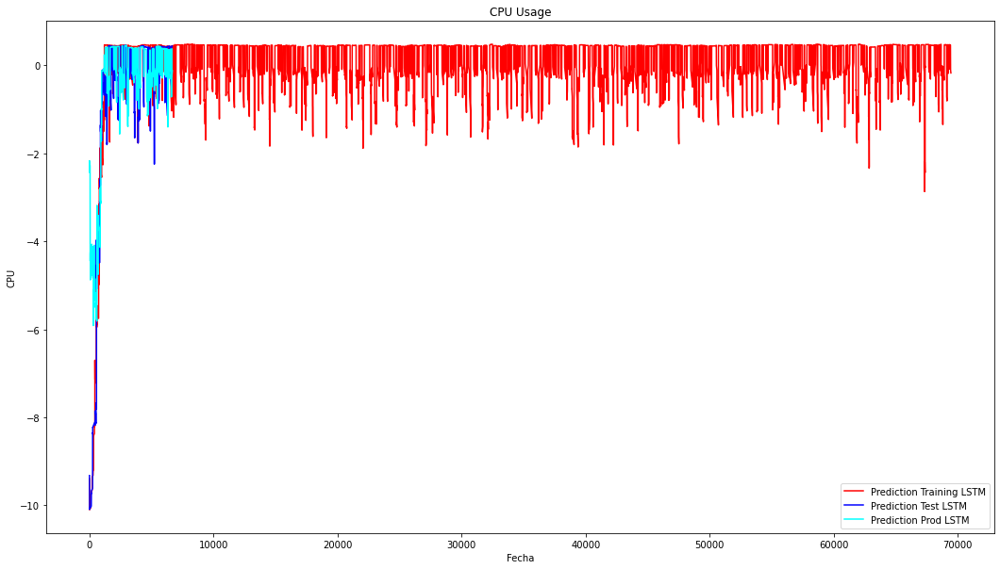

In [29]:
import matplotlib.pyplot as plt
f = plt.figure()
f.set_figwidth(18)
f.set_figheight(10)
plt.plot(res_train, color = 'red', label = 'Prediction Training LSTM')
plt.plot(res_valid, color = 'blue', label = 'Prediction Test LSTM')
plt.plot(res_prod, color = 'cyan', label = 'Prediction Prod LSTM')
plt.title("CPU Usage")
plt.xlabel("Fecha")
plt.ylabel("CPU")
plt.legend()
plt.show()